In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'price-volume-data-for-all-us-stocks-etfs:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4538%2F7213%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240513%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240513T022009Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D3613666cbed56d9075cf5ff5a1e6f92d79b039ea3c8470fa5d0b8e797226725325b86f7e61cc14c501cfa4986866e8b096ae751d01c11a0cea045514e61160648bc710a3376246cd020b1e90cd0f0e50bfcbf87245d8c4715cd1922a74afb4c00ffe93187e64368e13ba61bd1e1b8f917ec6b5f571c561acfe12a13f29f2482983a5d803d16f32687b0996537edbd793a1d095436c79b3947a2f8b9216727694105e76f73d2fdb060263e1ecf4d9d445a571a6b72b169fbe4140b2201f9359ee2b7aaaf6b6c30af13aebc360c6f1566b210122bc36fbef02ea7f60864ea37345b4012729e6b0eeb8e937c0e6b2a65205997aec6da1a0b1c663b88f2e5cc6c6b3,vanguard-500-index-fund-voo:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F3970846%2F6914911%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240513%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240513T022009Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D8df1e89da4554d3dccc893fab6665e091e6560c33f18038e7a37150f5fba3ab976ab96dfb3baa1dc18523ddcd055f2e8635834a68418934253870300249a4482cce9ab312eba8f3feee8060ef3b4f997d880892d7a8bfa879a43c0b22c292b20cb77ca0106e2763fd8e602c8d3883cc57de9e330c008682b1dc48ff5be53fcd175db5fb395c8d201220191cdd8657a175326f50aa2234fe8efabd7448ab0ce70b25df28872056db27176b1a3dd12719b4f91554575bc24e3cd019b83bc1b98843ec27138443d40d5ce1819c16d475966dd33e1605e2ae5f076678e237a469faf4585547581c3270ce52db3c3a2b8c3199090cad6e45c0d4d0a340d45ae257404,indian-stock-market-complete-dataset-2024:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4414796%2F7584241%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240513%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240513T022009Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D178837780c33148bb2647fc1baa80f8f3b7a88a1a860f4f93247b38614b7768b906886e55e8f86b429e421ca9faa3fc161e523abcadf9f400f56af9c1a5d4376af6300ce79d8b7432ed7f8f1cb8dde1b7aeb94f70714da7d0c58392576346ad182baab1756372e6c2c00cebf9dc35a92e58ed3759bc1ee529e15e8d3085aeea7721f273ba10f4d70e9f29404ba9e2ead4caa95c2410a0d47290fe4da846d31e163ef1622df341a7eb299fe2b82dca77953d1482aa3ca9e8ba32cef6acb734efc7e85fa04c8372577b8c9d76927852b1f91753d852d5c6ce050b4f645d6b907c7a9da81bf4ea8c0bdfcb0938e426f737166a9067a6ade96bef4d104d5e3b35db2,indian-food-dataset:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F4900223%2F8256943%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240513%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240513T022009Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D826582cc5188da6aefe7ee2235ca5fb3c1f8b53f0de2fc1bac2eee7eb179e8e70d1353b46fa2720bd8af11f1afa1dfc41b38072b6263d4ad2c87e531fb3e67752a717e9bc2e10c60e0de111f84fdbb4df2b7a4df951678c22a5405632492c20675c37ea545b019438dc6ebfa46dcf4457ed838b5fc800340ac6facd3b13be6644a039d189b62c82a76266f917b657aaa17a50b15c7a2f167c1cc7b445a92fe72dd1820aef1eebda897a053b6a0574e48dcfb93eb06b158c3dabc8e98d2f1fa67375ee99d5d81ebf216aac75afba6dfdd4eb883695c3306b4fb4ab19349dfeb87cc93e082d9613e1d4fbaacdc091fd892e286c02ddc211fcdad72ee801d756efd'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/indian-food-dataset/IndianFoodDatasetCSV.csv
/kaggle/input/vanguard-500-index-fund-voo/VOO Stock Data.csv
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/ufi.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/vfl.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/sohu.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/rdcm.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/virt.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/hylb.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/skt.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/asix.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/mac.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/gut.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/ngs.us.txt
/kaggle/input/price-volume-data-for-all-us-stocks-etfs/Stocks/vpg.us.txt

In [ ]:
!pip install numpy pandas matplotlib scikit-learn


In [ ]:
import pandas as pd
df = pd.read_csv('/kaggle/input/vanguard-500-index-fund-voo/VOO Stock Data.csv')
df.head(10)
print(df.head(10))
print(df.describe())
print(df.dtypes)

       Date    Open      High      Low   Close     Volume
0  11/07/23  400.26  402.0400  399.230  401.34  3352630.0
1  11/06/23  400.12  400.7330  398.460  400.21  4007105.0
2  11/03/23  397.92  400.8500  397.840  399.44  5981435.0
3  11/02/23  391.93  395.9096  391.920  395.78  4752164.0
4  11/01/23  385.09  389.0800  384.620  388.40  5549159.0
5  10/31/23  382.35  384.4800  380.560  384.17  4523160.0
6  10/30/23  379.91  382.8000  378.710  381.86  5795761.0
7  10/27/23  380.53  380.8900  375.945  377.32  5638752.0
8  10/26/23  382.63  383.3971  378.150  379.00  6959401.0
9  10/25/23  387.60  387.6800  383.120  383.71  5471214.0
              Open         High          Low        Close        Volume
count  3314.000000  3314.000000  3314.000000  3314.000000  3.314000e+03
mean    237.215078   238.458956   235.841214   237.242470  2.546310e+06
std      94.659605    95.271351    94.002811    94.668877  2.360743e+06
min      99.140000   101.860000    98.240000   100.340000  8.638000e+03
25

In [ ]:
df.columns = df.columns.str.strip()

# Data preprocessing step

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
df.sort_values('Date', inplace=True)

/tmp/ipykernel_33/1894350371.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['Date'] = pd.to_datetime(df['Date'])


In [ ]:
df.dtypes

Date      datetime64[ns]
Open             float64
High             float64
Low              float64
Close            float64
Volume           float64
dtype: object

In [ ]:
print(df.isnull().sum())

Date      0
Open      0
High      0
Low       0
Close     0
Volume    0
dtype: int64


In [ ]:
df.dropna(inplace=True)

# Feature Selection and Engineering

In [ ]:
# Use 'Date' as a numeric feature by converting it to the number of days since the start date
df['Time'] = (df['Date'] - df['Date'].min()).dt.days

In [ ]:
df.head(10)

,Date,Open,High,Low,Close,Volume,Time
3313,2010-09-09,102.50,102.50,101.140,101.3200,26513.0,0
3312,2010-09-10,101.68,101.86,101.296,101.7800,8638.0,1
3311,2010-09-13,102.96,103.14,102.500,103.0600,33752.5,4
3310,2010-09-14,102.84,103.48,102.380,103.0380,59420.0,5
3309,2010-09-15,102.62,103.38,102.400,103.3000,9283.0,6
3308,2010-09-16,103.02,103.32,102.700,103.2600,59580.5,7
3307,2010-09-17,103.88,103.88,103.020,103.3600,49365.0,8
3306,2010-09-20,103.74,105.04,103.460,105.0400,19006.0,11
3305,2010-09-21,105.02,105.44,104.280,104.7198,19286.5,12
3304,2010-09-22,104.56,105.04,103.960,104.1600,18148.0,13


In [ ]:
df.tail(10)

,Date,Open,High,Low,Close,Volume,Time
9,2023-10-25,387.60,387.6800,383.120,383.71,5471214.0,4794
8,2023-10-26,382.63,383.3971,378.150,379.00,6959401.0,4795
7,2023-10-27,380.53,380.8900,375.945,377.32,5638752.0,4796
6,2023-10-30,379.91,382.8000,378.710,381.86,5795761.0,4799
5,2023-10-31,382.35,384.4800,380.560,384.17,4523160.0,4800
4,2023-11-01,385.09,389.0800,384.620,388.40,5549159.0,4801
3,2023-11-02,391.93,395.9096,391.920,395.78,4752164.0,4802
2,2023-11-03,397.92,400.8500,397.840,399.44,5981435.0,4803
1,2023-11-06,400.12,400.7330,398.460,400.21,4007105.0,4806
0,2023-11-07,400.26,402.0400,399.230,401.34,3352630.0,4807


In [ ]:
# Resample to get the last observation of each year
yearly_data = df.resample('Y', on='Date').last()
# Reset index to make 'Date' a column
yearly_data.reset_index(drop=False, inplace=True)

# Now, create a DataFrame with years and the corresponding 'Close' prices
current_df = pd.DataFrame({
    'Year': yearly_data['Date'].dt.year,
    'Close Price': yearly_data['Close']
})

# Calculate percentage increase compared to the previous year
current_df['Percentage Increase'] = current_df['Close Price'].pct_change() * 100

# Print the resulting DataFrame
print(current_df)

    Year  Close Price  Percentage Increase
0   2010       115.14                  NaN
1   2011       114.90            -0.208442
2   2012       130.38            13.472585
3   2013       169.15            29.736156
4   2014       188.40            11.380432
5   2015       186.93            -0.780255
6   2016       205.31             9.832558
7   2017       245.29            19.472992
8   2018       229.81            -6.310897
9   2019       295.80            28.715025
10  2020       343.69            16.189993
11  2021       436.57            27.024353
12  2022       351.34           -19.522642
13  2023       401.34            14.231229


/tmp/ipykernel_33/3075640611.py:2: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly_data = df.resample('Y', on='Date').last()


In [ ]:
import numpy as np

# Define the starting year and its closing price for the investment
start_year = 2010
start_price = current_df.loc[current_df['Year'] == start_year, 'Close Price'].values[0]

# Calculate CAGR from the start year to each year
current_df['CAGR from Start (%)'] = ((current_df['Close Price'] / start_price) **
                                     (1 / (current_df['Year'] - start_year)) - 1) * 100

# Fix the value for the starting year to NaN since it's the initial year (no growth to calculate)
current_df.loc[current_df['Year'] == start_year, 'CAGR from Start (%)'] = np.nan
print(current_df)

    Year  Close Price  Percentage Increase  CAGR from Start (%)
0   2010       115.14                  NaN                  NaN
1   2011       114.90            -0.208442            -0.208442
2   2012       130.38            13.472585             6.412434
3   2013       169.15            29.736156            13.679440
4   2014       188.40            11.380432            13.100277
5   2015       186.93            -0.780255            10.176902
6   2016       205.31             9.832558            10.119436
7   2017       245.29            19.472992            11.409428
8   2018       229.81            -6.310897             9.022927
9   2019       295.80            28.715025            11.052980
10  2020       343.69            16.189993            11.556291
11  2021       436.57            27.024353            12.880961
12  2022       351.34           -19.522642             9.742567
13  2023       401.34            14.231229            10.081496


In [ ]:
print(df.columns)
from sklearn.model_selection import train_test_split
X = df[['Time']]  # Feature: Time
y = df['Open']   # Target: Close price

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Time'], dtype='object')


In [ ]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

RMSE: 24.866875283105173


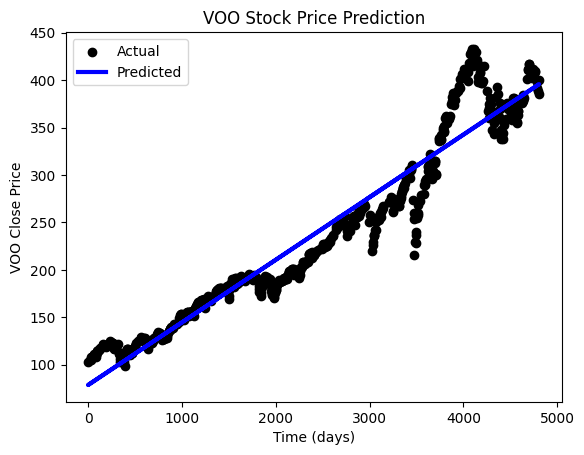

In [ ]:
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
predictions = model.predict(X_test)
print("RMSE:", np.sqrt(mean_squared_error(y_test, predictions)))

# Plotting
plt.scatter(X_test, y_test, color='black', label='Actual')
plt.plot(X_test, predictions, color='blue', linewidth=3, label='Predicted')
plt.xlabel('Time (days)')
plt.ylabel('VOO Close Price')
plt.title('VOO Stock Price Prediction')
plt.legend()
plt.show()


In [ ]:
# Predict for the next 10 years
future_times = np.array([X['Time'].max() + 365 * i for i in range(1, 11)]).reshape(-1, 1)
future_predictions = model.predict(future_times)

print("Future Predictions for the next 10 years:")
print(future_predictions)

Future Predictions for the next 10 years:
[419.87863432 443.95417948 468.02972463 492.10526979 516.18081495
 540.25636011 564.33190526 588.40745042 612.48299558 636.55854074]


/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [ ]:
import pandas as pd

df['Date'] = pd.to_datetime(df['Date'])  # Convert Date column to datetime if not already

# Calculate the maximum date and add one year
max_date = df['Date'].max()
start_date = pd.Timestamp(year=max_date.year - 1, month=1, day=1)

# Create a DataFrame for the predicted values
years = pd.date_range(start=start_date + pd.DateOffset(years=1), periods=10, freq='Y')
future_df = pd.DataFrame({
    'Year': years.year,
    'Predicted Close': future_predictions
})

# Calculate percentage increase compared to the previous year
future_df['Percentage Increase'] = future_df['Predicted Close'].pct_change() * 100
print(future_df)


   Year  Predicted Close  Percentage Increase
0  2023       419.878634                  NaN
1  2024       443.954179             5.733930
2  2025       468.029725             5.422980
3  2026       492.105270             5.144021
4  2027       516.180815             4.892357
5  2028       540.256360             4.664169
6  2029       564.331905             4.456319
7  2030       588.407450             4.266203
8  2031       612.482996             4.091645
9  2032       636.558541             3.930810


/tmp/ipykernel_33/3201132847.py:10: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  years = pd.date_range(start=start_date + pd.DateOffset(years=1), periods=10, freq='Y')


In [ ]:
start_year = 2023
# CAGR calculation
start_price = future_df.loc[0, 'Predicted Close']
# Calculate CAGR from the start year to each year
future_df['CAGR from Start (%)'] = ((future_df['Predicted Close'] / start_price) **
                                     (1 / (future_df['Year'] - start_year)) - 1) * 100

# Fix the value for the starting year to NaN since it's the initial year (no growth to calculate)
future_df.loc[future_df['Year'] == start_year, 'CAGR from Start (%)'] = np.nan

In [ ]:
print(future_df)

   Year  Predicted Close  Percentage Increase  CAGR from Start (%)
0  2023       419.878634                  NaN                  NaN
1  2024       443.954179             5.733930             5.733930
2  2025       468.029725             5.422980             5.578340
3  2026       492.105270             5.144021             5.433368
4  2027       516.180815             4.892357             5.297854
5  2028       540.256360             4.664169             5.170811
6  2029       564.331905             4.456319             5.051390
7  2030       588.407450             4.266203             4.938860
8  2031       612.482996             4.091645             4.832582
9  2032       636.558541             3.930810             4.732000
